# Behavioral Cloning

# The Data
**The data set contains one image folder and one CSV file**
**The image folder contains 12,159 images of car with the center view, right view, and left view. CSV file contain total 7 columns**
  >- **Column 1:** *Image location of the car captured while driving from the center view*
  >- **Column 2:** *Image location of the car captured while driving from the left view*
  >- **Column 3:** *Image location of the car captured while driving from the right view*
  >- **Column 4:** *Steering Angle*
  >- **Column 5:** *Throttle*
  >- **Column 6:** *Reverse*
  >- **Column 7:** *Speed of the car*

### Importing Required libraries to make the model work

In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import keras
from keras.models import Sequential
from keras.optimizers import Adam
from keras.layers import Convolution2D, Conv2D, MaxPooling2D, Dropout, Flatten, Dense
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from imgaug import augmenters as iaa
import cv2
import pandas as pd
import ntpath
import random

#### Importing CSV file

In [2]:
datadir = 'D:\Ryuzaki Project\\Deep Learning Project\\Self Driving Car\\Car Track'
data = pd.read_csv(os.path.join(datadir, 'driving_log.csv'))

In [3]:
data

,D:\Ryuzaki Project\Deep Learning Project\Self Driving Car\Car Track\IMG\center_2022_12_06_17_11_43_382.jpg,D:\Ryuzaki Project\Deep Learning Project\Self Driving Car\Car Track\IMG\left_2022_12_06_17_11_43_382.jpg,D:\Ryuzaki Project\Deep Learning Project\Self Driving Car\Car Track\IMG\right_2022_12_06_17_11_43_382.jpg,0,0.1,0.2,0.6497864
0,D:\Ryuzaki Project\Deep Learning Project\Self ...,D:\Ryuzaki Project\Deep Learning Project\Self ...,D:\Ryuzaki Project\Deep Learning Project\Self ...,0.0,0.0,0.0,0.627942
1,D:\Ryuzaki Project\Deep Learning Project\Self ...,D:\Ryuzaki Project\Deep Learning Project\Self ...,D:\Ryuzaki Project\Deep Learning Project\Self ...,0.0,0.0,0.0,0.622910
2,D:\Ryuzaki Project\Deep Learning Project\Self ...,D:\Ryuzaki Project\Deep Learning Project\Self ...,D:\Ryuzaki Project\Deep Learning Project\Self ...,0.0,0.0,0.0,0.619162
3,D:\Ryuzaki Project\Deep Learning Project\Self ...,D:\Ryuzaki Project\Deep Learning Project\Self ...,D:\Ryuzaki Project\Deep Learning Project\Self ...,0.0,0.0,0.0,0.615438
4,D:\Ryuzaki Project\Deep Learning Project\Self ...,D:\Ryuzaki Project\Deep Learning Project\Self ...,D:\Ryuzaki Project\Deep Learning Project\Self ...,0.0,0.0,0.0,0.610506
...,...,...,...,...,...,...,...
4047,D:\Ryuzaki Project\Deep Learning Project\Self ...,D:\Ryuzaki Project\Deep Learning Project\Self ...,D:\Ryuzaki Project\Deep Learning Project\Self ...,0.0,0.0,0.0,26.017680
4048,D:\Ryuzaki Project\Deep Learning Project\Self ...,D:\Ryuzaki Project\Deep Learning Project\Self ...,D:\Ryuzaki Project\Deep Learning Project\Self ...,0.0,0.0,0.0,25.808640
4049,D:\Ryuzaki Project\Deep Learning Project\Self ...,D:\Ryuzaki Project\Deep Learning Project\Self ...,D:\Ryuzaki Project\Deep Learning Project\Self ...,0.0,0.0,0.0,25.652960
4050,D:\Ryuzaki Project\Deep Learning Project\Self ...,D:\Ryuzaki Project\Deep Learning Project\Self ...,D:\Ryuzaki Project\Deep Learning Project\Self ...,0.0,0.0,0.0,25.446850


In [4]:
data.columns = ['center', 'left', 'right', 'steering', 'throttle', 'reverse', 'speed']

In [5]:
data

,center,left,right,steering,throttle,reverse,speed
0,D:\Ryuzaki Project\Deep Learning Project\Self ...,D:\Ryuzaki Project\Deep Learning Project\Self ...,D:\Ryuzaki Project\Deep Learning Project\Self ...,0.0,0.0,0.0,0.627942
1,D:\Ryuzaki Project\Deep Learning Project\Self ...,D:\Ryuzaki Project\Deep Learning Project\Self ...,D:\Ryuzaki Project\Deep Learning Project\Self ...,0.0,0.0,0.0,0.622910
2,D:\Ryuzaki Project\Deep Learning Project\Self ...,D:\Ryuzaki Project\Deep Learning Project\Self ...,D:\Ryuzaki Project\Deep Learning Project\Self ...,0.0,0.0,0.0,0.619162
3,D:\Ryuzaki Project\Deep Learning Project\Self ...,D:\Ryuzaki Project\Deep Learning Project\Self ...,D:\Ryuzaki Project\Deep Learning Project\Self ...,0.0,0.0,0.0,0.615438
4,D:\Ryuzaki Project\Deep Learning Project\Self ...,D:\Ryuzaki Project\Deep Learning Project\Self ...,D:\Ryuzaki Project\Deep Learning Project\Self ...,0.0,0.0,0.0,0.610506
...,...,...,...,...,...,...,...
4047,D:\Ryuzaki Project\Deep Learning Project\Self ...,D:\Ryuzaki Project\Deep Learning Project\Self ...,D:\Ryuzaki Project\Deep Learning Project\Self ...,0.0,0.0,0.0,26.017680
4048,D:\Ryuzaki Project\Deep Learning Project\Self ...,D:\Ryuzaki Project\Deep Learning Project\Self ...,D:\Ryuzaki Project\Deep Learning Project\Self ...,0.0,0.0,0.0,25.808640
4049,D:\Ryuzaki Project\Deep Learning Project\Self ...,D:\Ryuzaki Project\Deep Learning Project\Self ...,D:\Ryuzaki Project\Deep Learning Project\Self ...,0.0,0.0,0.0,25.652960
4050,D:\Ryuzaki Project\Deep Learning Project\Self ...,D:\Ryuzaki Project\Deep Learning Project\Self ...,D:\Ryuzaki Project\Deep Learning Project\Self ...,0.0,0.0,0.0,25.446850


In [6]:
ntpath.split(data['center'][0])

('D:\\Ryuzaki Project\\Deep Learning Project\\Self Driving Car\\Car Track\\IMG',
 'center_2022_12_06_17_11_43_670.jpg')

In [7]:
def path_leaf(path):
    head, tail = ntpath.split(path)
    return tail

In [8]:
data['center'] = data['center'].apply(path_leaf)
data['left'] = data['left'].apply(path_leaf)
data['right'] = data['right'].apply(path_leaf)
data.head()

,center,left,right,steering,throttle,reverse,speed
0,center_2022_12_06_17_11_43_670.jpg,left_2022_12_06_17_11_43_670.jpg,right_2022_12_06_17_11_43_670.jpg,0.0,0.0,0.0,0.627942
1,center_2022_12_06_17_11_43_724.jpg,left_2022_12_06_17_11_43_724.jpg,right_2022_12_06_17_11_43_724.jpg,0.0,0.0,0.0,0.622910
2,center_2022_12_06_17_11_43_792.jpg,left_2022_12_06_17_11_43_792.jpg,right_2022_12_06_17_11_43_792.jpg,0.0,0.0,0.0,0.619162
3,center_2022_12_06_17_11_43_860.jpg,left_2022_12_06_17_11_43_860.jpg,right_2022_12_06_17_11_43_860.jpg,0.0,0.0,0.0,0.615438
4,center_2022_12_06_17_11_43_930.jpg,left_2022_12_06_17_11_43_930.jpg,right_2022_12_06_17_11_43_930.jpg,0.0,0.0,0.0,0.610506


## Data Visualization

In [9]:
num_bins = 27
hist, bins = np.histogram(data["steering"], num_bins)
print(bins)

[-1.         -0.92592593 -0.85185185 -0.77777778 -0.7037037  -0.62962963
 -0.55555556 -0.48148148 -0.40740741 -0.33333333 -0.25925926 -0.18518519
 -0.11111111 -0.03703704  0.03703704  0.11111111  0.18518519  0.25925926
  0.33333333  0.40740741  0.48148148  0.55555556  0.62962963  0.7037037
  0.77777778  0.85185185  0.92592593  1.        ]


In [10]:
num_bins = 25
hist, bins = np.histogram(data["steering"], num_bins)
print(bins)

[-1.   -0.92 -0.84 -0.76 -0.68 -0.6  -0.52 -0.44 -0.36 -0.28 -0.2  -0.12
 -0.04  0.04  0.12  0.2   0.28  0.36  0.44  0.52  0.6   0.68  0.76  0.84
  0.92  1.  ]


In [11]:
num_bins = 25
hist, bins = np.histogram(data["steering"], num_bins)
center =  (bins[:-1] + bins[1:])* 0.5
print(center)

[-0.96 -0.88 -0.8  -0.72 -0.64 -0.56 -0.48 -0.4  -0.32 -0.24 -0.16 -0.08
  0.    0.08  0.16  0.24  0.32  0.4   0.48  0.56  0.64  0.72  0.8   0.88
  0.96]


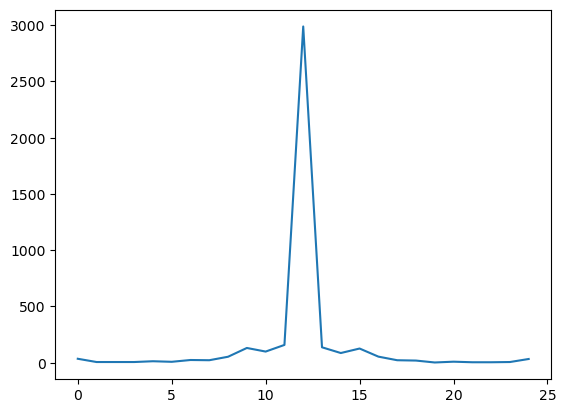

In [12]:
num_bins = 25
hist, bins = np.histogram(data["steering"], num_bins)
center =  (bins[:-1] + bins[1:])* 0.5
plt.plot(hist)

<BarContainer object of 25 artists>

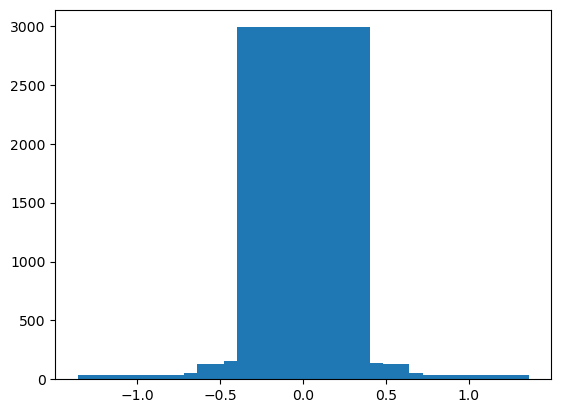

In [13]:
num_bins = 25
hist, bins = np.histogram(data["steering"], num_bins)
center =  (bins[:-1] + bins[1:])* 0.5
plt.bar(center, hist)

<BarContainer object of 25 artists>

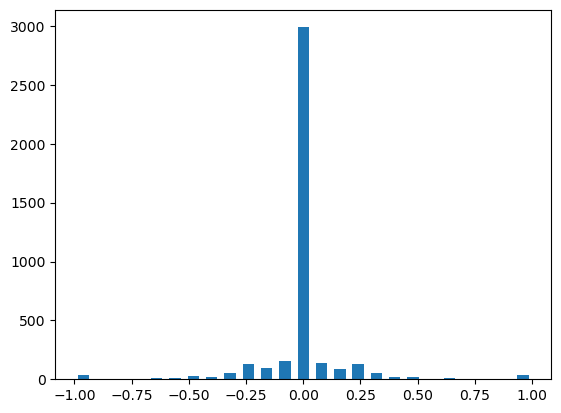

In [14]:
num_bins = 25
hist, bins = np.histogram(data["steering"], num_bins)
center =  (bins[:-1] + bins[1:])* 0.5
plt.bar(center, hist, width=0.05)

In [15]:
data["steering"].min()

-1.0

In [16]:
data["steering"].max()

1.0

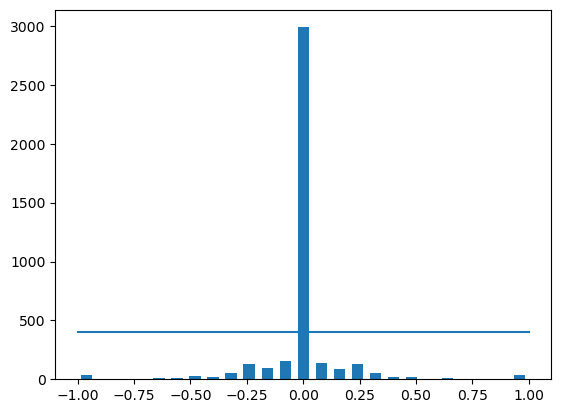

In [17]:
num_bins = 25
sample_per_bin = 400
hist, bins = np.histogram(data["steering"], num_bins)
center =  (bins[:-1] + bins[1:])* 0.5
plt.bar(center, hist, width=0.05)
plt.plot((data["steering"].min(), data["steering"].max()), (sample_per_bin, sample_per_bin))

## Balancing data

In [18]:
remove_list = []
for j in range(num_bins):
    print(j)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24


In [19]:
# remove_list = []
# for j in range(num_bins):
#     list_ = []
#     for i in range(len(data["steering"])):
#         print(i)

In [20]:
# remove_list = []
# for j in range(num_bins):
#     print(bins[j])

In [21]:
# remove_list = []
# for j in range(num_bins):
#     for i in range(len(data["steering"])):
#         print(data["steering"][i])

In [22]:
# remove_list = []
# for j in range(num_bins):
#     for i in range(len(data["steering"])):
#         if data["steering"][i] >= bins[j] and data["steering"][i] <= bins[j+1]:
#             print(data["steering"][i])

In [23]:
remove_list = []
for j in range(num_bins):
    list_ = []
    for i in range(len(data["steering"])):
        if data["steering"][i] >= bins[j] and data["steering"][i] <= bins[j+1]:
            list_.append(i)
    list_ = shuffle(list_)
    list_ = list_[sample_per_bin:]
    remove_list.extend(list_)

In [24]:
print("removed", len(remove_list))

removed 2589


In [25]:
print(("Total Bins", len(data)))

('Total Bins', 4052)


In [26]:
data.drop(data.index[remove_list], inplace=True)

In [27]:
print("remaining", len(data))

remaining 1463


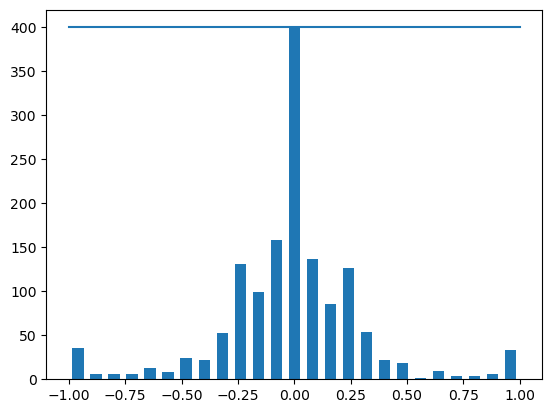

In [28]:
hist, _ = np.histogram(data["steering"], (num_bins))
plt.bar(center, hist, width=0.05)
plt.plot((data["steering"].min(), data["steering"].max()), (sample_per_bin, sample_per_bin))

In [29]:
print(data.iloc[1])

center      center_2022_12_06_17_11_44_485.jpg
left          left_2022_12_06_17_11_44_485.jpg
right        right_2022_12_06_17_11_44_485.jpg
steering                                 -0.25
throttle                              0.863326
reverse                                    0.0
speed                                 2.173052
Name: 12, dtype: object


In [30]:
def load_img_steering(datadir, df):
    image_path = []
    steering = []
    for i in range(len(data)):
        indexed_data = data.iloc[i]
        center, left, right = indexed_data[0], indexed_data[1], indexed_data[2]
        image_path.append(os.path.join(datadir, center.strip()))
        steering.append(float(indexed_data[3]))
        # left image append
        image_path.append(os.path.join(datadir,left.strip()))
        steering.append(float(indexed_data[3])+0.15)
        # right image append
        image_path.append(os.path.join(datadir,right.strip()))
        steering.append(float(indexed_data[3])-0.15)
    image_paths = np.asarray(image_path)
    steerings = np.asarray(steering)
    return image_paths, steerings

In [31]:
image_paths, steerings = load_img_steering(datadir + '/IMG', data)

In [ ]:
image_paths

In [ ]:
steerings

## Scikit Learn - Train Test Split

In [34]:
X_train, X_valid, y_train, y_valid = train_test_split(image_paths, steerings, test_size=0.2, random_state=6)

In [35]:
print('Training Samples: {}\nValid Samples: {}'.format(len(X_train), len(X_valid)))

Training Samples: 3511
Valid Samples: 878


### Visualizing Data Balance between Training Data and Test Data

Text(0.5, 1.0, 'Validation set')

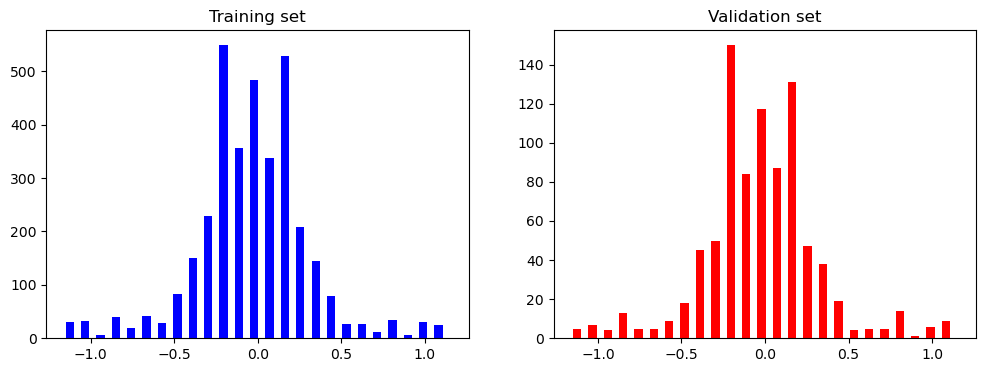

In [36]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].hist(y_train, bins=num_bins, width=0.05, color='blue')
axes[0].set_title('Training set')
axes[1].hist(y_valid, bins=num_bins, width=0.05, color='red')
axes[1].set_title('Validation set')

## Data Augmentation

#### Zooming the image

In [37]:
def zoom(image):
    zoom = iaa.Affine(scale=(1, 1.3))
    image = zoom.augment_image(image)
    return image

Text(0.5, 1.0, 'Zoomed Image')

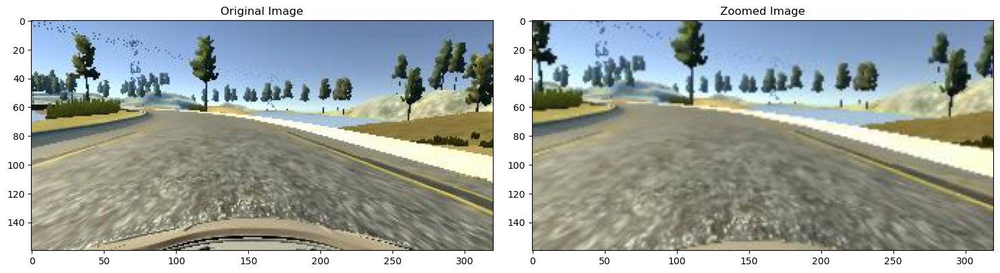

In [38]:
image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
zoomed_image = zoom(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(zoomed_image)
axs[1].set_title('Zoomed Image')

#### Image Panning

In [39]:
def pan(image):
    pan = iaa.Affine(translate_percent= {"x" : (-0.1, 0.1), "y": (-0.1, 0.1)})
    image = pan.augment_image(image)
    return image

Text(0.5, 1.0, 'Panned Image')

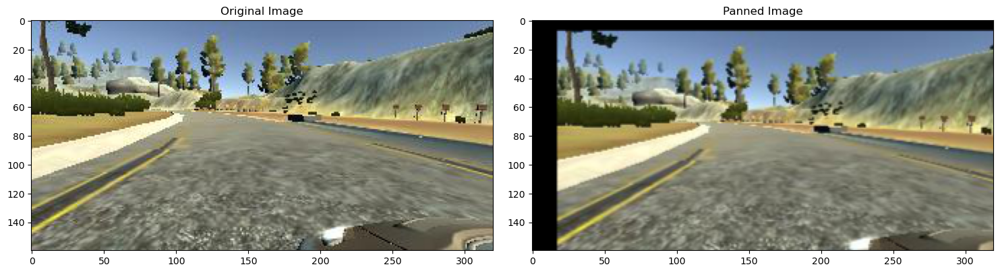

In [40]:
image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
panned_image = pan(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(panned_image)
axs[1].set_title('Panned Image')

#### Altering Brightness

In [41]:
def img_random_brightness(image):
    brightness = iaa.Multiply((0.2, 1.2))
    image = brightness.augment_image(image)
    return image

Text(0.5, 1.0, 'Brightness altered image ')

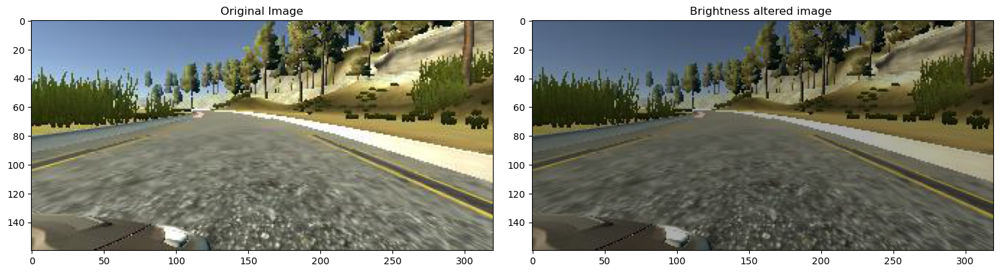

In [42]:
image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
brightness_altered_image = img_random_brightness(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(brightness_altered_image)
axs[1].set_title('Brightness altered image ')

#### Flipping

In [43]:
def img_random_flip(image, steering_angle):
    image = cv2.flip(image,1)
    steering_angle = -steering_angle
    return image, steering_angle

Text(0.5, 1.0, 'Flipped Image - Steering Angle:0.25')

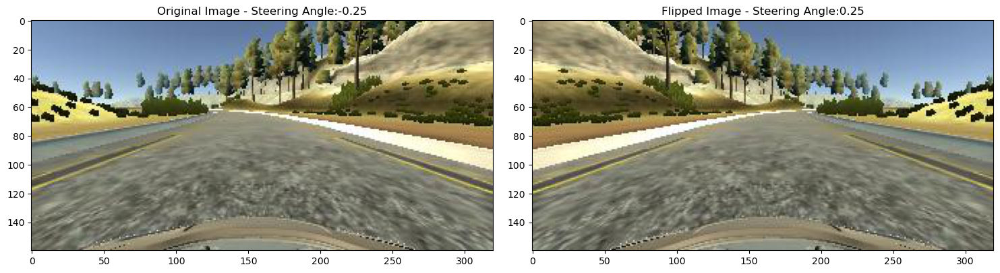

In [44]:
random_index = random.randint(0, 1000)
image = image_paths[random_index]
steering_angle = steerings[random_index]


original_image = mpimg.imread(image)
flipped_image, flipped_steering_angle = img_random_flip(original_image, steering_angle)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image - ' + 'Steering Angle:' + str(steering_angle))

axs[1].imshow(flipped_image)
axs[1].set_title('Flipped Image - ' + 'Steering Angle:' + str(flipped_steering_angle))

#### Combining Augmentations

In [45]:
def random_augment(image, steering_angle):
    image = mpimg.imread(image)
    if np.random.rand() < 0.5:
        image = pan(image)
    if np.random.rand() < 0.5:
        image = zoom(image)
    if np.random.rand() < 0.5:
        image = img_random_brightness(image)
    if np.random.rand() < 0.5:
        image, steering_angle = img_random_flip(image, steering_angle)

    return image, steering_angle

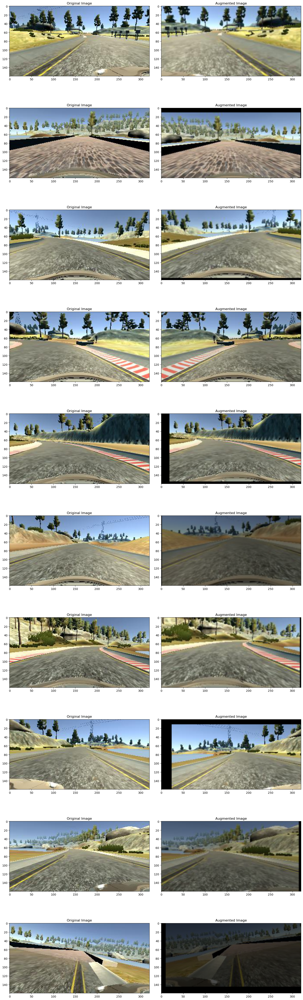

In [46]:
ncol = 2
nrow = 10

fig, axs = plt.subplots(nrow, ncol, figsize=(15, 50))
fig.tight_layout()

for i in range(10):
    randnum = random.randint(0, len(image_paths) - 1)
    random_image = image_paths[randnum]
    random_steering = steerings[randnum]

    original_image = mpimg.imread(random_image)
    augmented_image, steering = random_augment(random_image, random_steering)

    axs[i][0].imshow(original_image)
    axs[i][0].set_title("Original Image")

    axs[i][1].imshow(augmented_image)
    axs[i][1].set_title("Augmented Image")

## Preprocessing Images

In [47]:
def img_preprocess(img):
    img = img[60:135,:,:]
    img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
    img = cv2.GaussianBlur(img,  (3, 3), 0)
    img = cv2.resize(img, (200, 66))
    img = img/255
    return img

Text(0.5, 1.0, 'Preprocessed Image')

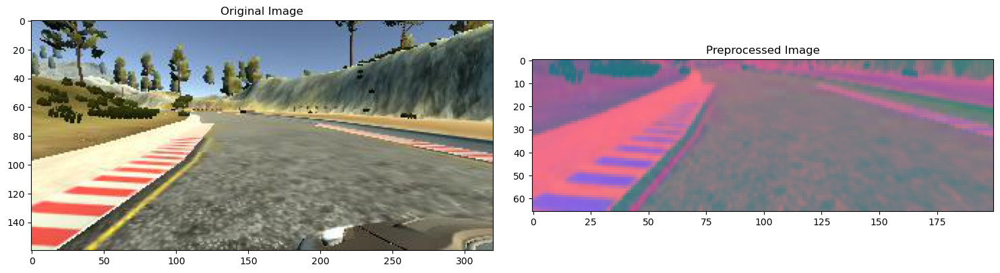

In [48]:
image = image_paths[100]
original_image = mpimg.imread(image)
preprocessed_image = img_preprocess(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
axs[0].imshow(original_image)
axs[0].set_title('Original Image')
axs[1].imshow(preprocessed_image)
axs[1].set_title('Preprocessed Image')

## Image Generator

In [49]:
def batch_generator(image_paths, steering_ang, batch_size, istraining):

    while True:
        batch_img = []
        batch_steering = []

        for i in range(batch_size):
            random_index = random.randint(0, len(image_paths) - 1)

            if istraining:
                im, steering = random_augment(image_paths[random_index], steering_ang[random_index])

            else:
                im = mpimg.imread(image_paths[random_index])
                steering = steering_ang[random_index]

            im = img_preprocess(im)
            batch_img.append(im)
            batch_steering.append(steering)
        yield (np.asarray(batch_img), np.asarray(batch_steering))

Text(0.5, 1.0, 'Validation Image')

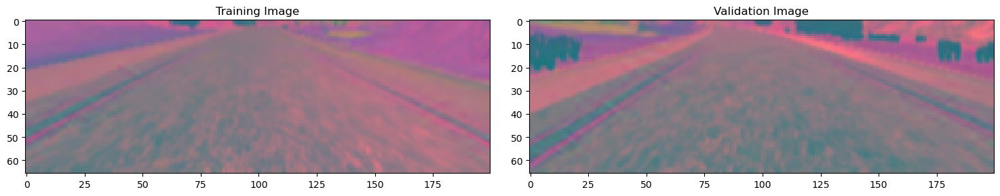

In [50]:
x_train_gen, y_train_gen = next(batch_generator(X_train, y_train, 1, 1))
x_valid_gen, y_valid_gen = next(batch_generator(X_valid, y_valid, 1, 0))

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(x_train_gen[0])
axs[0].set_title('Training Image')

axs[1].imshow(x_valid_gen[0])
axs[1].set_title('Validation Image')

## Nvidia Model
<img src="NVIDIA-Convolutional-Neural-Network-13.jpg">

In [51]:
def nvidia_model():
    model = Sequential()
    model.add(Conv2D(24, kernel_size=(5, 5), strides=(2, 2), input_shape=(66, 200, 3), activation='elu'))
    model.add(Conv2D(36, kernel_size=(5, 5), strides=(2, 2), activation='elu'))
    model.add(Conv2D(48, kernel_size=(5, 5), strides=(2, 2), activation='elu'))
    model.add(Conv2D(64, kernel_size=(3, 3), activation='elu'))
    model.add(Conv2D(64, kernel_size=(3, 3), activation='elu'))
    #   model.add(Dropout(0.5))


    model.add(Flatten())

    model.add(Dense(100, activation = 'elu'))
    #   model.add(Dropout(0.5))

    model.add(Dense(50, activation = 'elu'))
    #   model.add(Dropout(0.5))

    model.add(Dense(10, activation = 'elu'))
    #   model.add(Dropout(0.5))

    model.add(Dense(1))

    optimizer = Adam(lr=1e-3)
    model.compile(loss='mse', optimizer=optimizer)
    return model

In [52]:
model = nvidia_model()
print(model.summary())

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 31, 98, 24)        1824      
                                                                 
 conv2d_1 (Conv2D)           (None, 14, 47, 36)        21636     
                                                                 
 conv2d_2 (Conv2D)           (None, 5, 22, 48)         43248     
                                                                 
 conv2d_3 (Conv2D)           (None, 3, 20, 64)         27712     
                                                                 
 conv2d_4 (Conv2D)           (None, 1, 18, 64)         36928     
                                                                 
 flatten (Flatten)           (None, 1152)              0         
                                                                 
 dense (Dense)               (None, 100)               1

C:\Users\gujja\anaconda3\lib\site-packages\keras\optimizers\optimizer_v2\adam.py:117: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


In [53]:
history = model.fit_generator(batch_generator(X_train, y_train, 100, 1),
                              steps_per_epoch=300,
                              epochs=10,
                              validation_data=batch_generator(X_valid, y_valid, 100, 0),
                              validation_steps=200,
                              verbose=1,
                              shuffle = 1)

C:\Users\gujja\AppData\Local\Temp\ipykernel_5116\1689961276.py:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(batch_generator(X_train, y_train, 100, 1),


Epoch 1/10
300/300 [==============================] - 312s 1s/step - loss: 0.1746 - val_loss: 0.0777
Epoch 2/10
300/300 [==============================] - 248s 827ms/step - loss: 0.0765 - val_loss: 0.0712
Epoch 3/10
300/300 [==============================] - 207s 691ms/step - loss: 0.0620 - val_loss: 0.0483
Epoch 4/10
300/300 [==============================] - 273s 910ms/step - loss: 0.0534 - val_loss: 0.0377
Epoch 5/10
300/300 [==============================] - 388s 1s/step - loss: 0.0486 - val_loss: 0.0380
Epoch 6/10
300/300 [==============================] - 270s 901ms/step - loss: 0.0455 - val_loss: 0.0347
Epoch 7/10
300/300 [==============================] - 203s 677ms/step - loss: 0.0436 - val_loss: 0.0310
Epoch 8/10
300/300 [==============================] - 204s 681ms/step - loss: 0.0439 - val_loss: 0.0286
Epoch 9/10
300/300 [==============================] - 205s 683ms/step - loss: 0.0410 - val_loss: 0.0290
Epoch 10/10
300/300 [==============================] - 205s 684ms/step

Text(0.5, 0, 'Epoch')

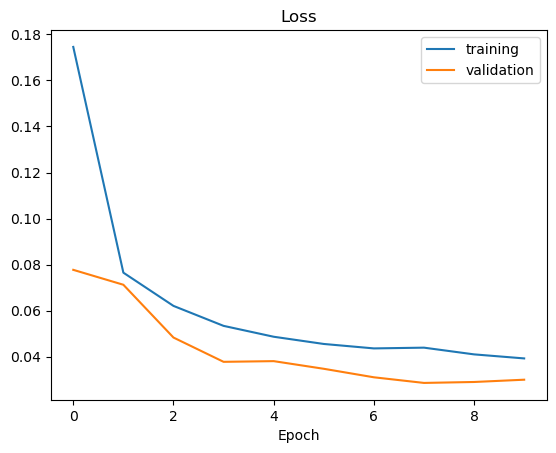

In [54]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['training', 'validation'])
plt.title('Loss')
plt.xlabel('Epoch')

#### Saving our model

In [57]:
model.save('final_model.h5')